## Persona base ##


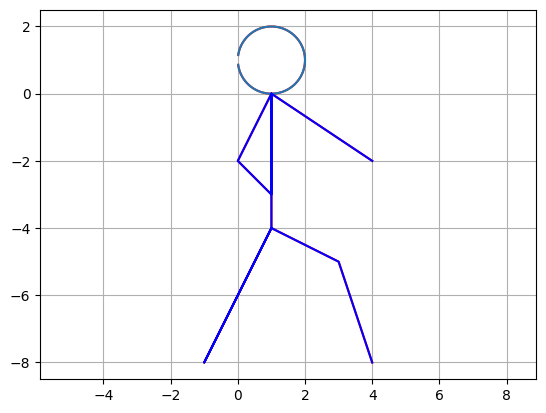

In [1]:
import numpy as np
import matplotlib.pyplot as plt

print('## Persona base ##')
def transformacion(A):
    """
    Función que realiza transformaciones lineales en una figura en 2D.

    Parameters:
    - A: Matriz asociada a la transformación lineal.

    Returns:
    - None
    """

    # Dibuja la cara
    t = np.arange(-3, 3, 0.01)
    x = np.cos(t) + 1
    y = np.sin(t) + 1
    plt.plot(x, y, 'r')

    # Dibuja el cuerpo
    x1 = np.array([4, 1, 0, 1, 1, 1, -1, 1, 3, 4])
    y1 = np.array([-2, 0, -2, -3, 0, -4, -8, -4, -5, -8])
    plt.plot(x1, y1, 'r')

    # Forma la matriz de puntos
    Pcara = np.vstack((x, y))
    Pcuerpo = np.vstack((x1, y1))

    # Aplica una transformación lineal de R2 en R2 cuya matriz asociada es la ingresada A
    Imcara = np.dot(A, Pcara)
    Imcuerpo = np.dot(A, Pcuerpo)

    xim, yim = Imcara[0, :], Imcara[1, :]
    x1im, y1im = Imcuerpo[0, :], Imcuerpo[1, :]

    plt.plot(xim, yim, x1im, y1im, 'b')
    plt.grid()
    plt.axis('equal')
    plt.show()

# Ejemplo de uso
# Ingresa la matriz asociada A desde el teclado
A = np.array([[1, 0],
              [0, 1]])
transformacion(A)

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def transformacion_animada(transformaciones, title):
    fig, ax = plt.subplots()

    def update(frame):
        ax.clear()
        plt.title(f'{title} - Frame {frame:.2f}')

        A = transformaciones[int(frame / frames_per_transform)]
        t = np.arange(-3, 3, 0.01)
        x = np.cos(t) + 1
        y = np.sin(t) + 1
        plt.plot(x, y, 'r')

        x1 = np.array([4, 1, 0, 1, 1, 1, -1, 1, 3, 4])
        y1 = np.array([-2, 0, -2, -3, 0, -4, -8, -4, -5, -8])
        plt.plot(x1, y1, 'r')

        Pcara = np.vstack((x, y))
        Pcuerpo = np.vstack((x1, y1))

        Imcara = np.dot(A, Pcara)
        Imcuerpo = np.dot(A, Pcuerpo)

        xim, yim = Imcara[0, :], Imcara[1, :]
        x1im, y1im = Imcuerpo[0, :], Imcuerpo[1, :]

        plt.plot(xim, yim, x1im, y1im, 'b')
        plt.grid()
        plt.axis('equal')

    num_frames = 100
    frames_per_transform = num_frames / len(transformaciones)
    frames = np.arange(0, num_frames, 1)

    animation = FuncAnimation(fig, update, frames=frames, blit=False)
    return HTML(animation.to_jshtml())

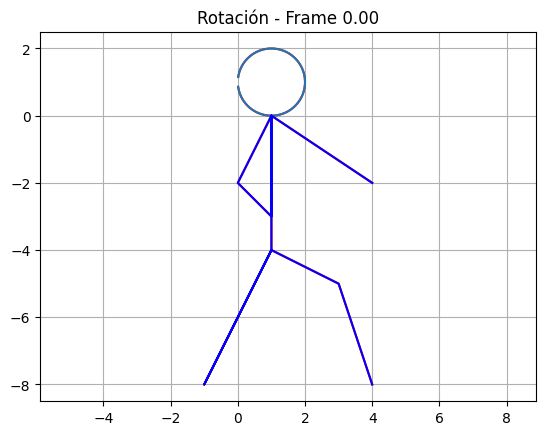

In [24]:
# Crear una lista de matrices de transformación para cada animación
rotar_animacion = [np.array([[np.cos(theta), -np.sin(theta)],
                             [np.sin(theta), np.cos(theta)]]) for theta in np.linspace(0, 2*np.pi, 100)]

# Crear y mostrar animaciones
transformacion_animada(rotar_animacion, 'Rotación')

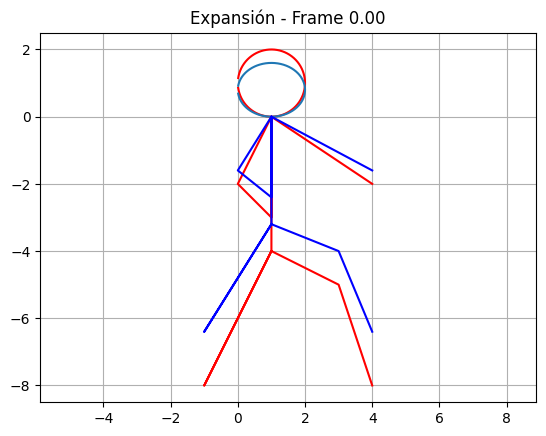

In [28]:
# Crear una lista de matrices de transformación para cada animación
expandir_animacion = [np.array([[1 + 0.01 * i, 0], 
                                [0, 0.8 + 0.01 * i]]) for i in range(100)]

# Crear y mostrar animaciones
transformacion_animada(expandir_animacion, 'Expansión')

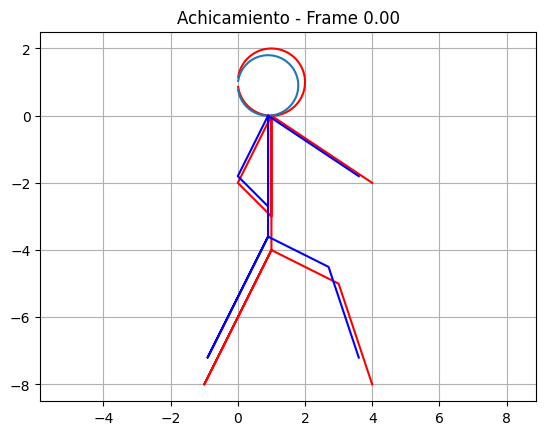

In [31]:
# Crear una lista de matrices de transformación para cada animación
achicar_animacion = [np.array([[0.9 - 0.01 * i, 0],
                               [0, 0.9 - 0.01 * i]]) for i in range(100)]

# Crear y mostrar animaciones
transformacion_animada(achicar_animacion, 'Achicamiento')

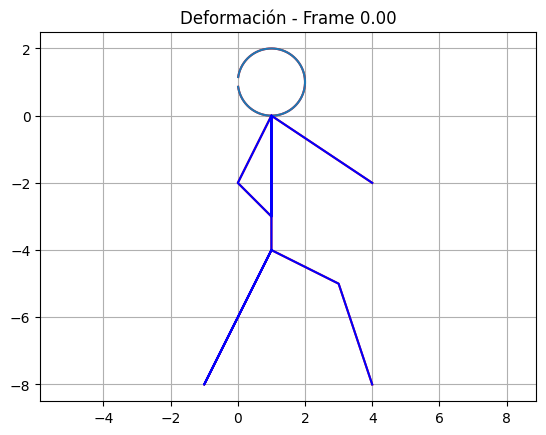

In [30]:
# Crear una lista de matrices de transformación para cada animación
deformar_animacion = [np.array([[1, 0.5 * np.sin(theta)],
                                [0, 1]]) for theta in np.linspace(0, 2*np.pi, 100)]

# Crear y mostrar animaciones
transformacion_animada(deformar_animacion, 'Deformación')